In [29]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from pathlib import Path
import os
from tqdm import tqdm
from collections import defaultdict
import yaml

def load_class_names(yaml_path):
    """Load class names from YAML file"""
    with open(yaml_path, 'r') as f:
        yaml_data = yaml.safe_load(f)
    return yaml_data['names']

def process_results(results):
    """Process YOLO results into structured format"""
    predictions = defaultdict(list)
    for result in results:
        boxes = result.boxes
        if len(boxes) > 0:
            predictions['confidence'].extend(boxes.conf.cpu().numpy())
            predictions['class'].extend(boxes.cls.cpu().numpy())
            predictions['xywh'].extend(boxes.xywh.cpu().numpy())
            if hasattr(boxes, 'speed'):
                predictions['speed'].append({
                    'preprocess': boxes.speed['preprocess'],
                    'inference': boxes.speed['inference'],
                    'postprocess': boxes.speed['postprocess']
                })
    return predictions

def evaluate_yolo_model(model_path, test_data_path, data_yaml_path, sample_size=None):
    """
    Evaluate YOLO model performance on test dataset with comprehensive metrics
    
    Args:
        model_path (str): Path to the best weights file
        test_data_path (str): Path to test data directory
        data_yaml_path (str): Path to data.yaml file for validation
    """
    # Load the trained model and class names
    model = YOLO(model_path)
    class_names = load_class_names(data_yaml_path)
    
    # Run validation to get standard metrics
    val_results = model.val(data=data_yaml_path, split='test')
    
    # Get inference results for additional analysis
    # Get all image files
    all_images = [img for img in os.listdir(test_data_path) 
                 if img.endswith(('.jpg', '.jpeg', '.png'))]
    
    # Take random sample if sample_size is specified
    if sample_size is not None:
        import random
        sampled_images = random.sample(all_images, min(sample_size, len(all_images)))
        test_images = [os.path.join(test_data_path, img) for img in sampled_images]
        print(f"Using {len(test_images)} images for evaluation (sampled)")
    else:
        test_images = [os.path.join(test_data_path, img) for img in all_images]
        print(f"Using all {len(test_images)} images for evaluation")
    
    results = []
    for img_path in tqdm(test_images, desc="Running inference on test images"):
        result = model(img_path, verbose=False)
        results.extend(result)
    
    predictions = process_results(results)
    
    # Create figure with subplots
    fig = plt.figure(figsize=(20, 25))
    plt.rcParams['axes.grid'] = True
    plt.rcParams['grid.alpha'] = 0.3
    
    # 1. Mean Metrics
    ax1 = plt.subplot(4, 2, 1)
    metrics = ['precision', 'recall', 'mAP50', 'mAP50-95']
    values = [
        val_results.box.mp,
        val_results.box.mr,
        val_results.box.map50,
        val_results.box.map
    ]
    ax1.bar(metrics, values)
    ax1.set_ylim(0, 1)
    ax1.set_ylabel('Score')
    ax1.set_title('Mean Metrics')
    for i, v in enumerate(values):
        ax1.text(i, v + 0.01, f'{v:.3f}', ha='center')
    
    # 2. Confusion Matrix
    ax2 = plt.subplot(4, 2, 2)
    conf_mat = val_results.confusion_matrix.matrix
    sns.heatmap(conf_mat, annot=True, fmt='.2f', cmap='Blues', ax=ax2,
                xticklabels=list(class_names.values()),
                yticklabels=list(class_names.values()))
    ax2.set_title('Confusion Matrix')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('True')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    
    # 3. Per-class Metrics
    ax3 = plt.subplot(4, 2, 3)
    class_metrics = pd.DataFrame({
        'Precision': val_results.box.p,
        'Recall': val_results.box.r,
        'F1-Score': val_results.box.f1
    })
    class_metrics.plot(kind='bar', ax=ax3)
    ax3.set_xlabel('Class')
    ax3.set_ylabel('Score')
    ax3.set_title('Per-class Metrics')
    ax3.set_xticks(range(len(class_names)))
    ax3.set_xticklabels(class_names.values(), rotation=45, ha='right')
    ax3.legend()
    
    # 4. mAP by IoU threshold
    ax4 = plt.subplot(4, 2, 4)
    maps = [val_results.box.map50, val_results.box.map75, val_results.box.map]
    labels = ['mAP@0.5', 'mAP@0.75', 'mAP@0.5:0.95']
    ax4.bar(labels, maps)
    ax4.set_ylabel('Score')
    ax4.set_title('Mean Average Precision (mAP) Metrics')
    for i, v in enumerate(maps):
        ax4.text(i, v + 0.01, f'{v:.3f}', ha='center')
    
    # 5. Confidence Distribution by Class
    ax5 = plt.subplot(4, 2, 5)
    conf_by_class = pd.DataFrame({
        'class': [class_names[int(c)] for c in predictions['class']],
        'confidence': predictions['confidence']
    })
    sns.boxplot(data=conf_by_class, x='class', y='confidence', ax=ax5)
    ax5.set_xlabel('Class')
    ax5.set_ylabel('Confidence')
    ax5.set_title('Confidence Distribution by Class')
    plt.xticks(rotation=45, ha='right')
    
    # 6. Detection Spatial Distribution
    ax6 = plt.subplot(4, 2, 6)
    xywh = np.array(predictions['xywh'])
    if len(xywh) > 0:
        heatmap, xedges, yedges = np.histogram2d(xywh[:, 0], xywh[:, 1], bins=50)
        sns.heatmap(heatmap.T, ax=ax6)
        ax6.set_title('Detection Spatial Distribution Heatmap')
    
    # 7. Processing Speed Analysis
    ax7 = plt.subplot(4, 2, 7)
    if predictions.get('speed'):
        speed_df = pd.DataFrame(predictions['speed'])
        speed_means = speed_df.mean()
        sns.barplot(x=speed_means.index, y=speed_means.values, ax=ax7)
        ax7.set_ylabel('Time (ms)')
        ax7.set_title('Average Processing Time per Stage')
    
    # 8. Box Size Distribution by Class
    ax8 = plt.subplot(4, 2, 8)
    if len(xywh) > 0:
        areas = xywh[:, 2] * xywh[:, 3]  # width * height
        box_sizes = pd.DataFrame({
            'class': [class_names[int(c)] for c in predictions['class']],
            'area': areas
        })
        sns.boxplot(data=box_sizes, x='class', y='area', ax=ax8)
        ax8.set_xlabel('Class')
        ax8.set_ylabel('Bounding Box Area')
        ax8.set_title('Box Size Distribution by Class')
        plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    
    # Print comprehensive metrics
    print("\n=== YOLO Model Evaluation Results ===")
    print("\n=== Standard Metrics ===")
    print(f"mAP@0.5: {val_results.box.map50:.3f}")
    print(f"mAP@0.75: {val_results.box.map75:.3f}")
    print(f"mAP@0.5:0.95: {val_results.box.map:.3f}")
    print(f"Mean Precision: {val_results.box.mp:.3f}")
    print(f"Mean Recall: {val_results.box.mr:.3f}")
    
    print("\n=== Per-Class Metrics ===")
    for i, (f1, p, r) in enumerate(zip(val_results.box.f1, 
                                     val_results.box.p, 
                                     val_results.box.r)):
        print(f"{class_names[i]}:")
        print(f"  F1-Score: {f1:.3f}")
        print(f"  Precision: {p:.3f}")
        print(f"  Recall: {r:.3f}")
    
    print("\n=== Detection Statistics ===")
    print(f"Total images processed: {len(test_images)}")
    print(f"Total detections: {len(predictions['confidence'])}")
    print(f"Average detections per image: {len(predictions['confidence'])/len(test_images):.2f}")
    print(f"Mean confidence: {np.mean(predictions['confidence']):.3f}")
    
    if predictions.get('speed'):
        print("\n=== Speed Metrics ===")
        for stage in speed_means.index:
            print(f"Average {stage} time: {speed_means[stage]:.2f}ms")
    
    return fig, val_results, predictions

In [30]:
model_path = '/teamspace/studios/this_studio/runs/detect/train5/weights/best.pt'
test_data_path = '/teamspace/studios/this_studio/datasets/pad/images/test'
data_yaml_path = "/teamspace/studios/this_studio/yolo_train.yaml" 

fig, val_results, predictions = evaluate_yolo_model(
    model_path, 
    test_data_path, 
    data_yaml_path,
)

plt.savefig('yolo_metrics_debug.png', dpi=300, bbox_inches='tight')
plt.close()

Ultralytics 8.3.65 🚀 Python-3.12.5 torch-2.5.1+cu124 CPU (Intel Xeon Platinum 8488C)
YOLO11n summary (fused): 238 layers, 2,583,907 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /teamspace/studios/this_studio/datasets/pad/labels/test.cache... 628 images, 0 backgrounds, 0 corrupt: 100%|██████████| 628/628 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/40 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [01:03<00:00,  1.58s/it]


                   all        628        628      0.727      0.599      0.644      0.642
Spallation_ExposedBars_CorrosionStain        189        189      0.908      0.836      0.909      0.905
            Background        150        150      0.775      0.988      0.937      0.937
                 Crack        127        127      0.876      0.892      0.933      0.933
         Efflorescence        119        119      0.952      0.756      0.903      0.903
Crack_and_Spallation_ExposedBars_CorrosionStain         13         13      0.307      0.385      0.327      0.326
Crack_and_Efflorescence          7          7          1          0     0.0924     0.0859
Efflorescence_and_Spallation_ExposedBars_CorrosionStain         20         20       0.83        0.6      0.673      0.673
Crack_and_Efflorescence_and_Spallation_ExposedBars_CorrosionStain          3          3      0.164      0.333      0.376      0.376
Speed: 0.9ms preprocess, 88.0ms inference, 0.0ms loss, 0.3ms postprocess per image

Running inference on test images: 100%|██████████| 628/628 [00:55<00:00, 11.24it/s]



=== YOLO Model Evaluation Results ===

=== Standard Metrics ===
mAP@0.5: 0.644
mAP@0.75: 0.644
mAP@0.5:0.95: 0.642
Mean Precision: 0.727
Mean Recall: 0.599

=== Per-Class Metrics ===
Spall_Bars_CorrStain:
  F1-Score: 0.870
  Precision: 0.908
  Recall: 0.836
Background:
  F1-Score: 0.869
  Precision: 0.775
  Recall: 0.988
Crack:
  F1-Score: 0.884
  Precision: 0.876
  Recall: 0.892
Efflorescence:
  F1-Score: 0.843
  Precision: 0.952
  Recall: 0.756
Crack-Spall_Bars_CorrStain:
  F1-Score: 0.342
  Precision: 0.307
  Recall: 0.385
Crack_and_Efflorescence:
  F1-Score: 0.000
  Precision: 1.000
  Recall: 0.000
Efflorescence-Spall_Bars_CorrStain:
  F1-Score: 0.697
  Precision: 0.830
  Recall: 0.600
Crack-Efflorescence-Spall_Bars_CorrStain:
  F1-Score: 0.220
  Precision: 0.164
  Recall: 0.333

=== Detection Statistics ===
Total images processed: 628
Total detections: 663
Average detections per image: 1.06
Mean confidence: 0.900


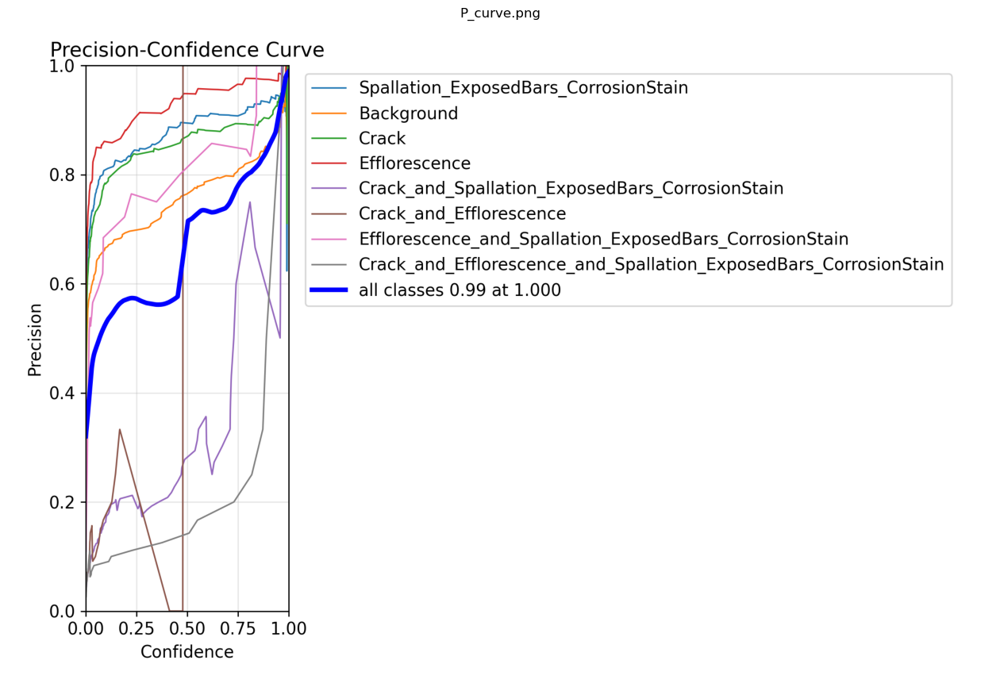

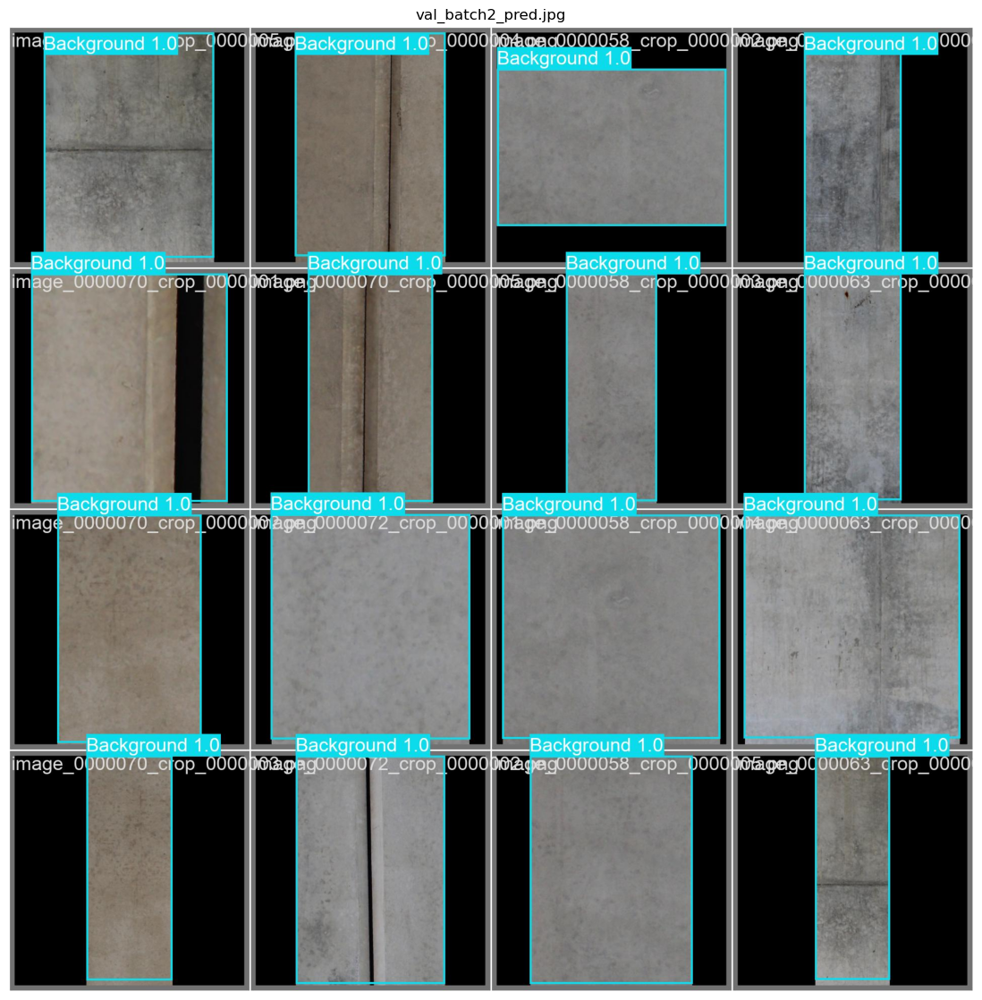

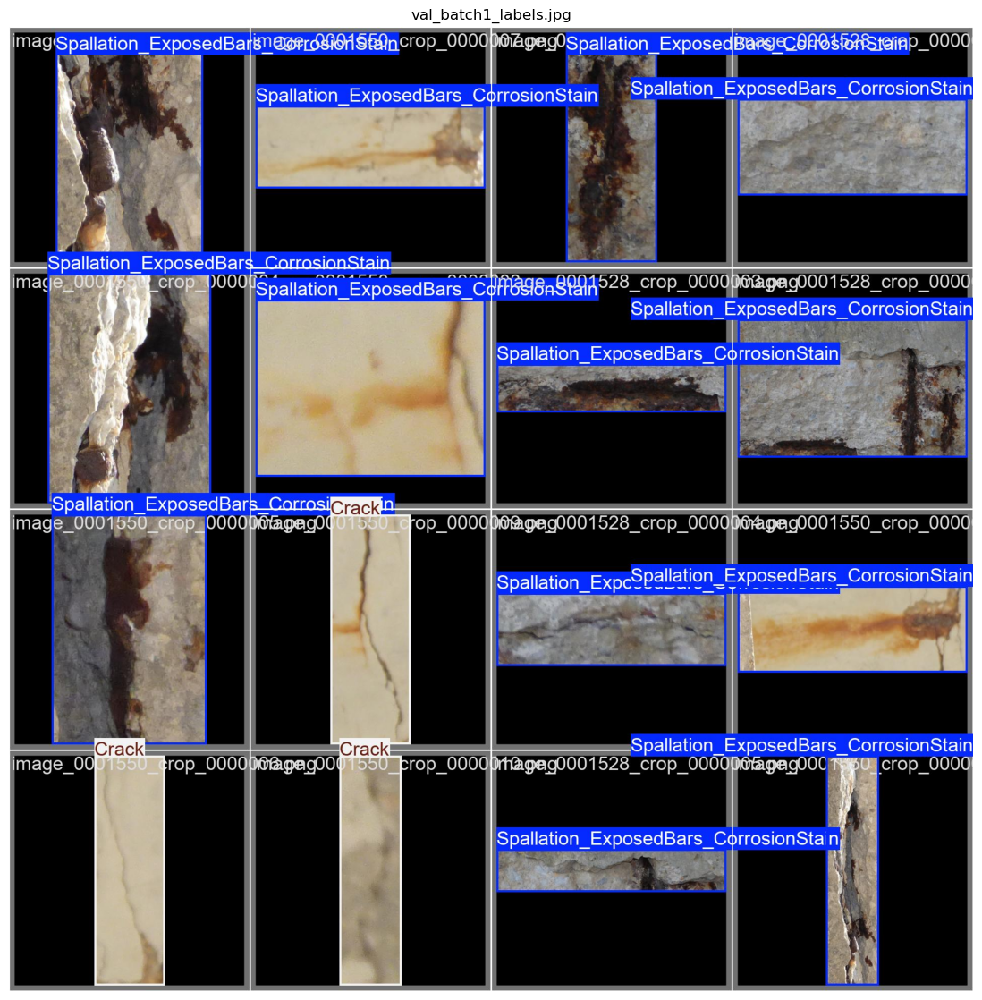

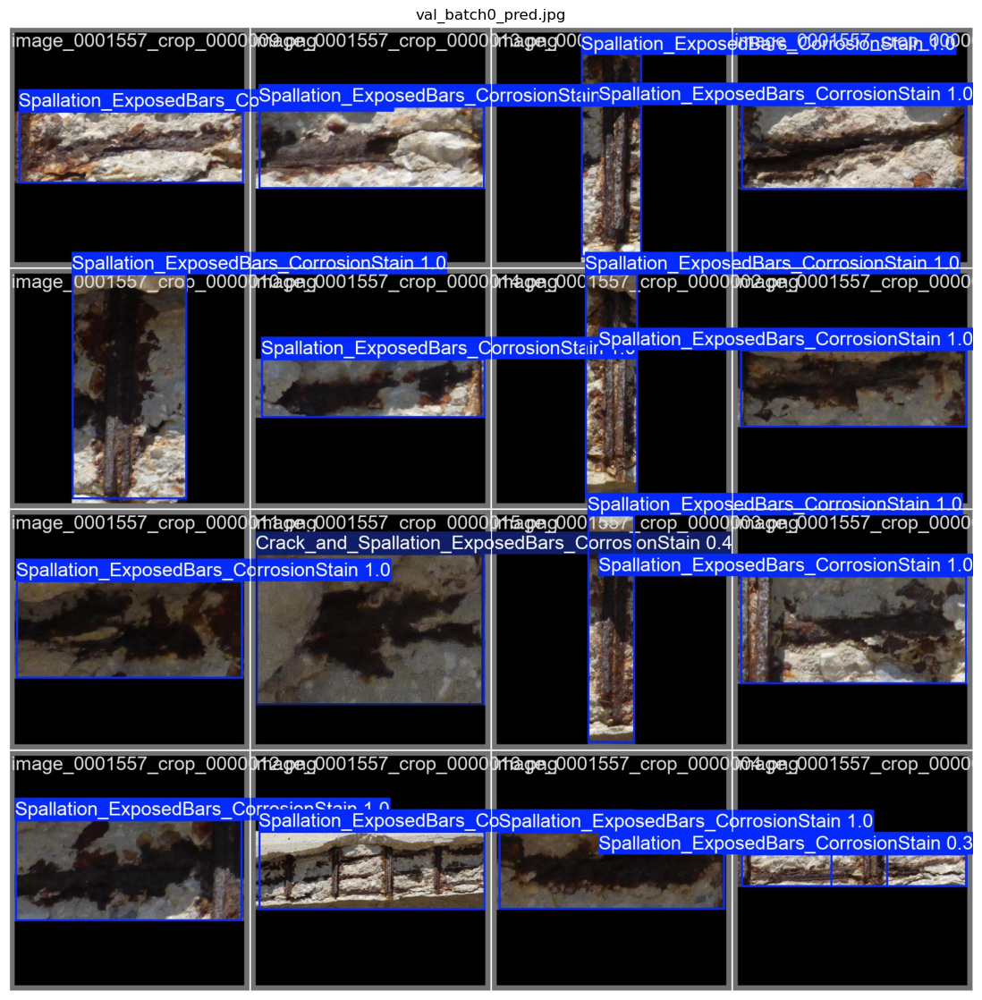

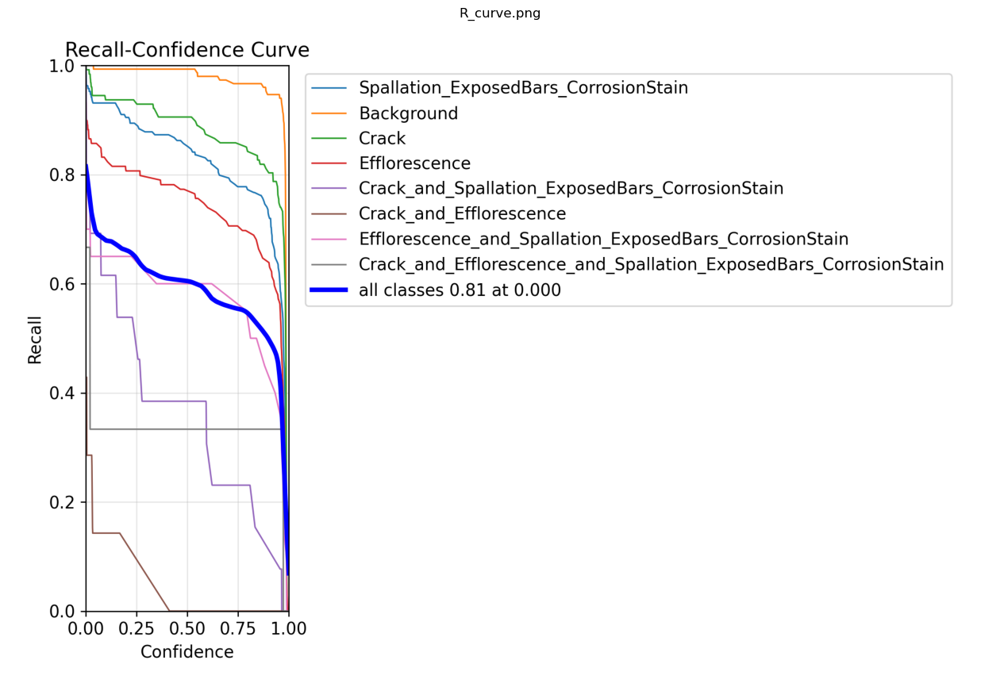

...

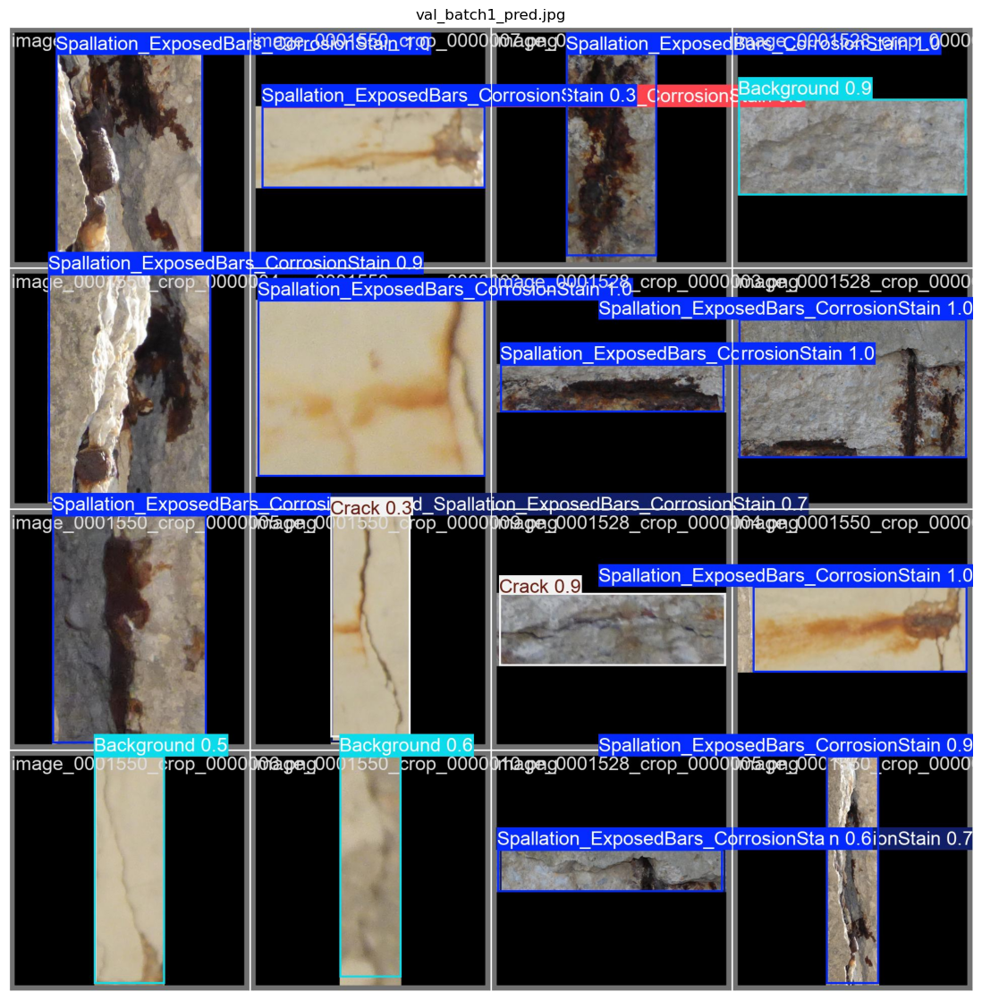

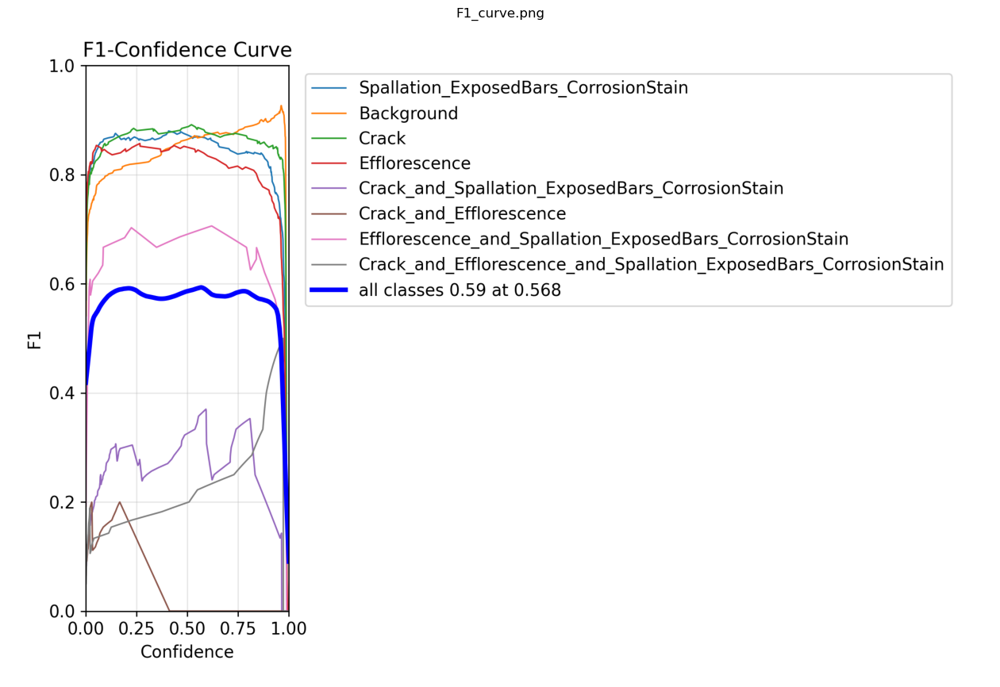

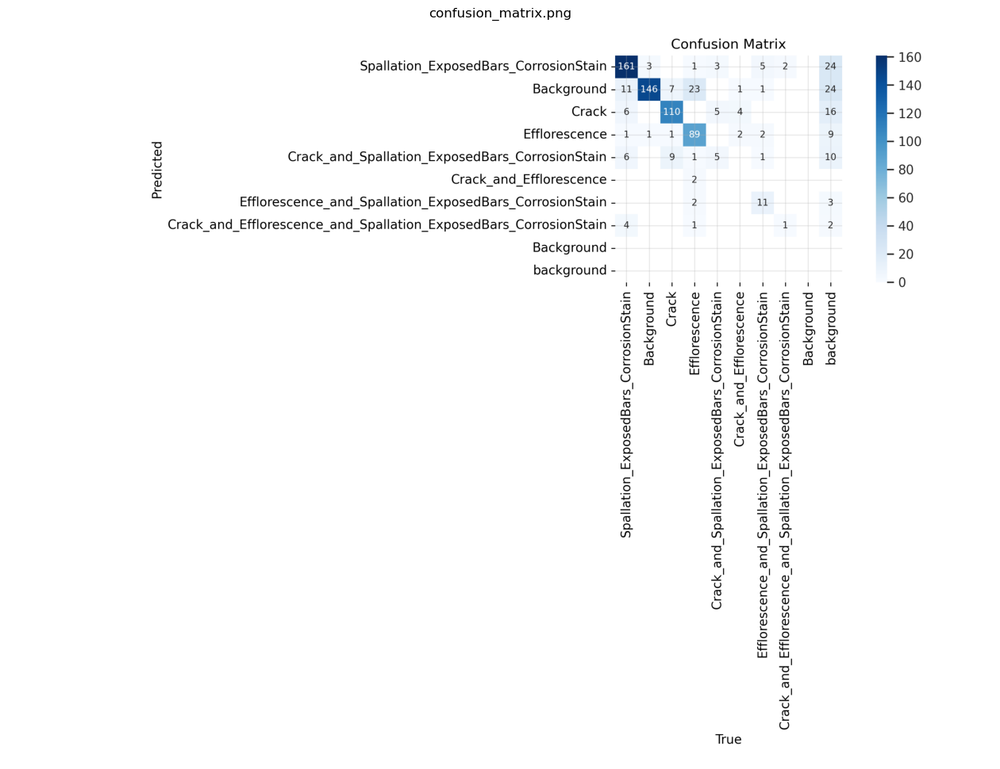

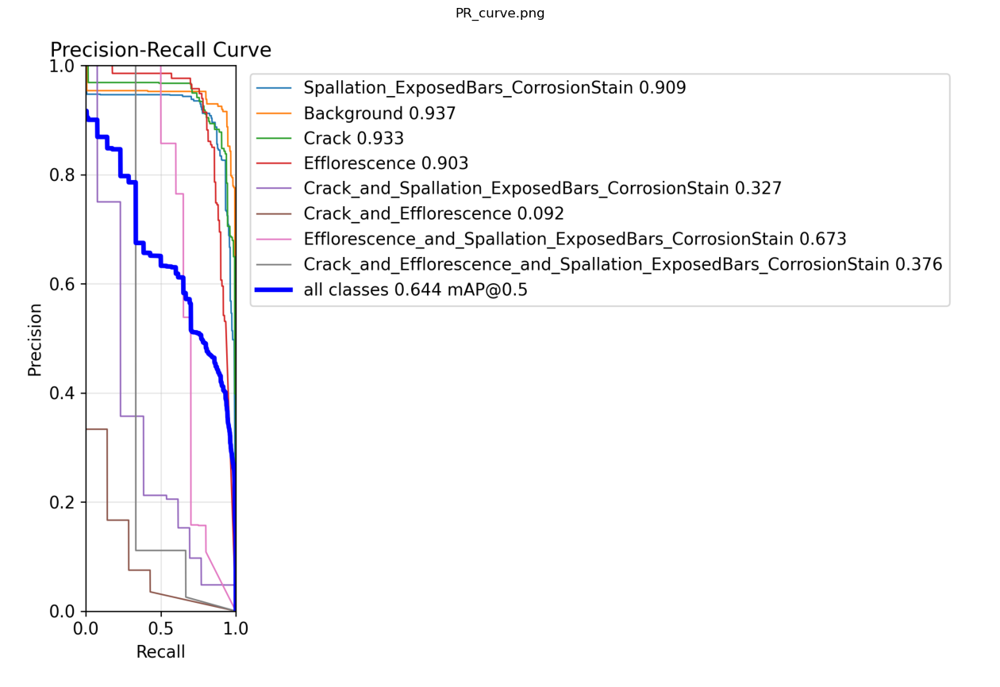

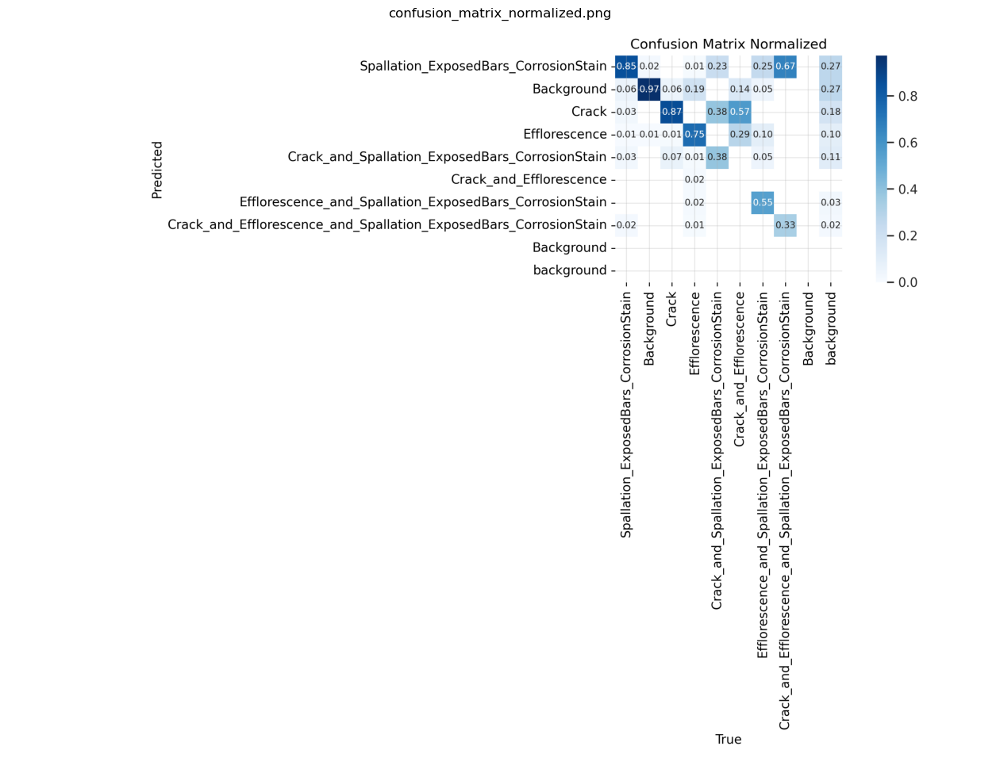

In [31]:
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np

def plot_images_in_folder(folder_path):
    # Get all files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]
    
    if not image_files:
        print("No image files found in the specified folder.")
        return
    
    # Display each image in a separate figure
    for img_file in image_files:
        # Read image
        img_path = os.path.join(folder_path, img_file)
        img = Image.open(img_path)
        
        # Create new figure for each image
        plt.figure(figsize=(16, 14))
        plt.imshow(np.array(img))
        plt.title(img_file)
        plt.axis('off')
        plt.show()
        
        # Optional: close the figure to free memory
        plt.close()

# Example usage
run_dir = '/teamspace/studios/this_studio/ai-capstone-proj/notebooks/training_no2_8_classes/runs/detect/val'
plot_images_in_folder(run_dir)

In [ ]:
from lightning_sdk import Studio

s = Studio()
s.sleep()